# Cut 3D Labels with a Plane

This notebook shows how to cut from code a segmentation result generated from a volumetric image using a plane with `napari_crop.cut_with_plane`.

Alternatively, one could use the plugin under "Tools > Utilities > Cut volume with plane (napari-crop)".

In [1]:
import numpy as np
import napari
from napari.utils import nbscreenshot
from skimage.data import cells3d
import pyclesperanto_prototype as cle
from napari_crop import cut_with_plane

We open the nuclei channel from the `cells3d` example data and change the viewer camera angle for better display.

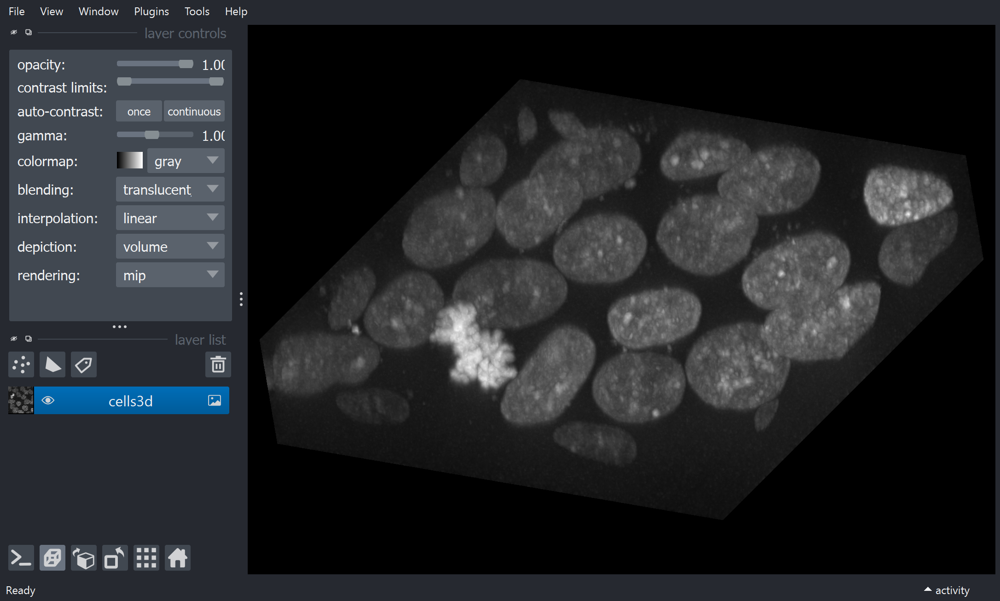

In [2]:
image = cells3d()[:, 1] # here we take just the nuclei channel
viewer = napari.Viewer(ndisplay=3)
viewer.add_image(image, name='cells3d')

# Change camera position for better 3D visualization
viewer.camera.angles = (45, 45, 45)

nbscreenshot(viewer)

## Add a plane to napari
The way to visualize a plane in napari is by adding a 3D image and setting the image layer `depiction` parameter to 'plane' and `blending` to 'additive'. You may also want to decrease the opacity of the original volume data in order to better visualize the plane. The plane parameters are given by a dictionary as shown below.

If using the plugin, the plane is automatically created.

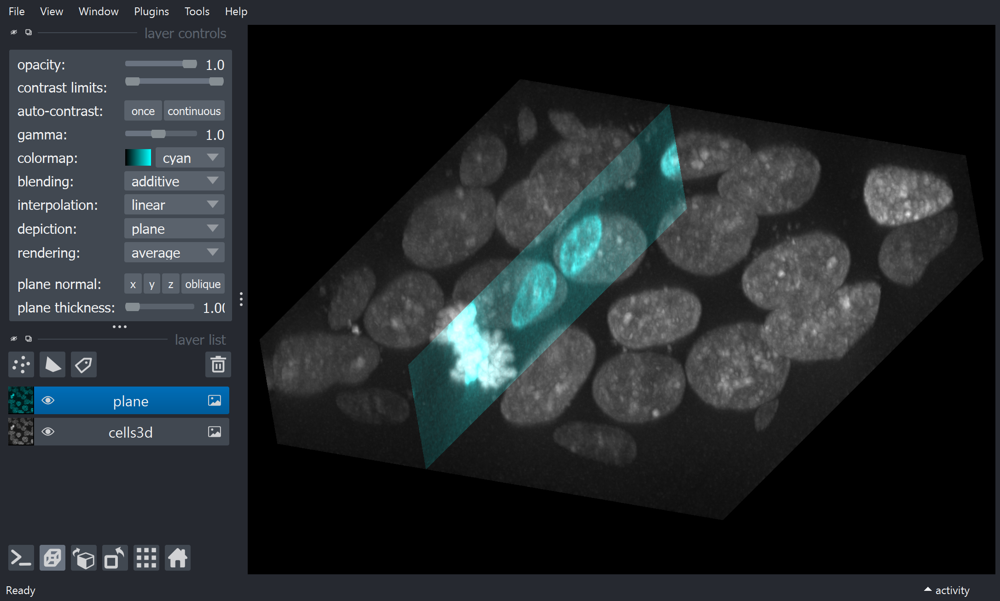

In [3]:
plane_parameters = {
    'position': (30, 85, 128),
    'normal': (0, 1, 0)
    }
plane_layer = viewer.add_image(
    image,
    name='plane',
    rendering='average',
    depiction='plane',
    blending='additive',
    colormap='cyan',
    plane=plane_parameters
    )

nbscreenshot(viewer)

## Adding a segmentation result

We segment the nuclei using `voronoi_otsu_labeling` from [pyclesperanto](https://github.com/clEsperanto/pyclesperanto_prototype).

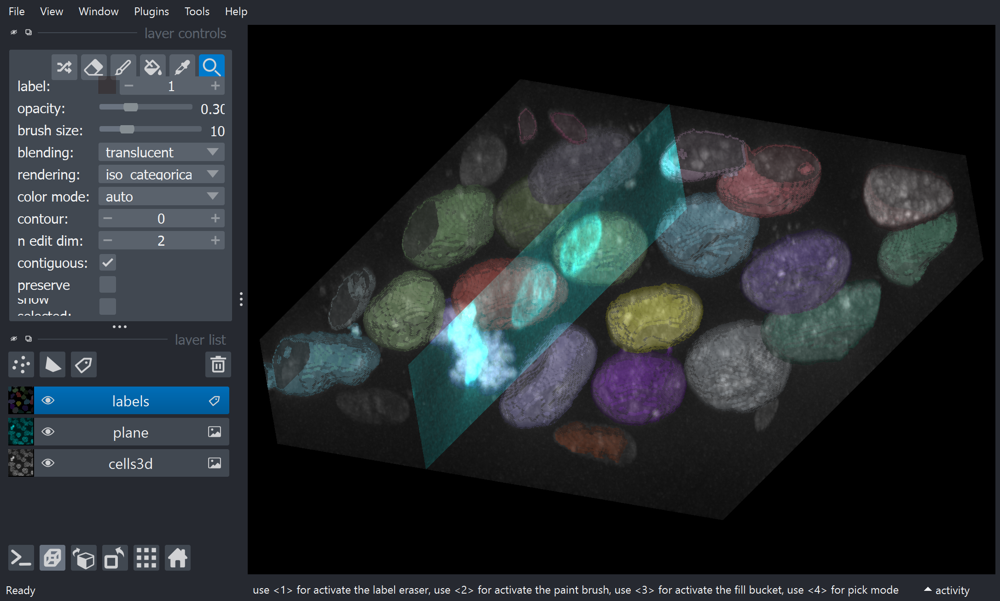

In [4]:
segmented = cle.voronoi_otsu_labeling(image, spot_sigma=10, outline_sigma=1)
viewer.add_labels(segmented, name='labels', opacity=0.3)

nbscreenshot(viewer)

## Manipulating the plane and cutting

We can move the plane by dragging it with the mouse while holding `SHIFT` (make sure you have the layer 'plane' selected) or by updating the `plane.position` property of the plane layer.

To change the plane normal, one can use click on the `x`, `y`, `z` or `oblique` buttons (for 'oblique', plane normal will be ortogonal to the camera view) in the layer options in napari (make sure you have the layer 'plane' selected to see them) or update the `plane.normal` property of the 'plane' layer. 

With the plugin, it is also possible directly to swap to ortogonal planes by clicking on the 'Ortogonal Planes' button.

In [5]:
image_to_be_cut = segmented
plane_normal = plane_layer.plane.normal
plane_position = plane_layer.plane.position

To cut the labels volume, we call the `cut_with_plane` function and give as arguments the image to be cut (in this example, the result of the segmentation), and the plane properties (which we got from the 'plane' layer in napari). The `positive_cut` boolean argument determines which side of the plane will be kept.

*Notice: the result has the same shape as the input image, which means that this cut implementation behaves more like a masking operation than a cropping operation!*

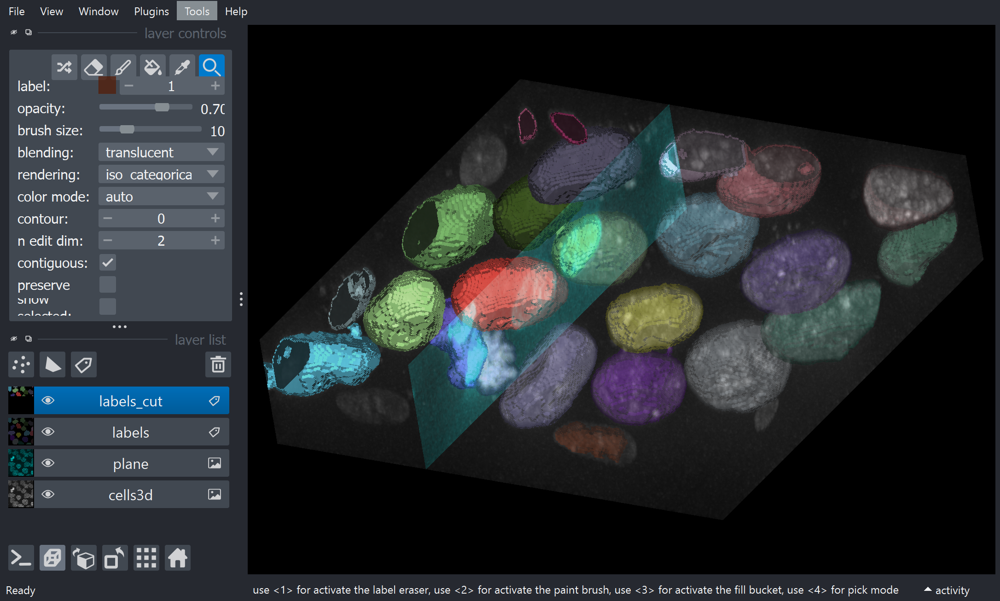

In [6]:
labels_cut = cut_with_plane(image_to_be_cut, plane_normal, plane_position, positive_cut=False)

viewer.add_labels(labels_cut, name='labels_cut')

nbscreenshot(viewer)